# Applied Data Analysis

#### Code: Güzide Nur Demir
#### Report: Merve Özer 

In [3]:
import pandas as pd

C:\ProgramData\Anaconda3\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
C:\ProgramData\Anaconda3\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [5]:
data = pd.read_csv("ICUPatients.csv")
data.head()

,Patientid,ICU Type,Origin Level of Care,Age,Sex,LOS,previous_LOS,previous_ICU_stays,Type,Charlson_index,...,var_SOFA_Nerv,Var_SOFA_Renal,Var_SOFA_Respiratory,Var_SOFA_Cardio,AdmitApache,DischargeApache,MeanApache,MaxApache,Readmitted,death
0,213620,Trauma,Regular,61,M,258.283333,2.166667,0,SURG,0,...,0.000000,0.000000,0.253700,0.166490,75,68,70.517241,86,0,1
1,213630,Cardiac-T,HOME,74,M,37.933333,0.000000,0,SURG,0,...,0.166667,0.000000,0.266667,0.166667,73,64,75.400000,81,0,0
2,213633,Surgical,HOME,53,M,304.566667,0.000000,0,SURG,0,...,0.172549,0.038431,0.000000,0.019608,77,58,75.769231,92,0,0
3,213650,Medical,HOME,39,F,19.416667,0.000000,0,MED,0,...,2.250000,0.000000,0.000000,0.250000,73,73,73.000000,73,0,0
4,213654,Neuro,HOME,55,M,268.700000,0.000000,0,SURG,0,...,0.158586,0.000000,0.234343,0.022222,84,73,70.411765,84,1,0


######  "death"  column is considered as a label.

In [6]:
x = data.drop('death', axis = 1)
y = data['death']

In [7]:
median = x.median()

x = x.fillna(median) #fill all null variables with median of the features.
price_null_index = y[y.isnull()].index
x.drop(price_null_index, inplace=True) #drop the null variables.
y.drop(price_null_index, inplace=True)

In [8]:
train_x_d = pd.get_dummies(x) #get the dummy variable of categorical variables.
train_x_d.head()

,Patientid,Age,LOS,previous_LOS,previous_ICU_stays,Charlson_index,weekend,disch_night,cvc_status,SIRS_48_hour,...,ICU Type_Surgical,ICU Type_Transplant,ICU Type_Trauma,Origin Level of Care_HOME,Origin Level of Care_Regular,Origin Level of Care_SDU,Sex_F,Sex_M,Type_MED,Type_SURG
0,213620,61,258.283333,2.166667,0,0,0,1,1,0,...,0,0,1,0,1,0,0,1,0,1
1,213630,74,37.933333,0.000000,0,0,0,0,1,0,...,0,0,0,1,0,0,0,1,0,1
2,213633,53,304.566667,0.000000,0,0,0,1,0,1,...,1,0,0,1,0,0,0,1,0,1
3,213650,39,19.416667,0.000000,0,0,0,1,0,0,...,0,0,0,1,0,0,1,0,1,0
4,213654,55,268.700000,0.000000,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,1


###### "Readmitted" column is considered as a Label

In [9]:
x_r = data.drop('Readmitted', axis = 1)
y_r = data['Readmitted']

In [10]:
median_r = x_r.median()

x_r = x_r.fillna(median_r) #fill all null variables with median of the features.
price_null_index = y_r[y_r.isnull()].index
x_r.drop(price_null_index, inplace=True) #drop the null variables.
y_r.drop(price_null_index, inplace=True)

In [11]:
train_x_r = pd.get_dummies(x_r) #get the dummy variable of categorical variables.
train_x_r.head()

,Patientid,Age,LOS,previous_LOS,previous_ICU_stays,Charlson_index,weekend,disch_night,cvc_status,SIRS_48_hour,...,ICU Type_Surgical,ICU Type_Transplant,ICU Type_Trauma,Origin Level of Care_HOME,Origin Level of Care_Regular,Origin Level of Care_SDU,Sex_F,Sex_M,Type_MED,Type_SURG
0,213620,61,258.283333,2.166667,0,0,0,1,1,0,...,0,0,1,0,1,0,0,1,0,1
1,213630,74,37.933333,0.000000,0,0,0,0,1,0,...,0,0,0,1,0,0,0,1,0,1
2,213633,53,304.566667,0.000000,0,0,0,1,0,1,...,1,0,0,1,0,0,0,1,0,1
3,213650,39,19.416667,0.000000,0,0,0,1,0,0,...,0,0,0,1,0,0,1,0,1,0
4,213654,55,268.700000,0.000000,0,0,0,0,0,1,...,0,0,0,1,0,0,0,1,0,1


In [12]:
from sklearn.model_selection import train_test_split

###### Split data into train and test using death column as a target.

In [13]:
x_train, x_test, y_train, y_test = train_test_split(train_x_d, y, test_size=0.20, random_state=0)

###### With Multinomial Logistic Regression model

In [14]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

In [15]:
log_reg = LogisticRegression(solver='lbfgs',
                                      tol=1e-6, max_iter=int(1e6),
                                      warm_start=True,
                                      intercept_scaling=10000., multi_class='multinomial')

In [16]:
log_reg.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=10000.0, l1_ratio=None, max_iter=1000000,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=1e-06, verbose=0,
                   warm_start=True)

###### Perform 5 fold Cross Validation 

In [17]:
accuracy = cross_val_score(log_reg, x_train, y_train, cv=5, scoring="accuracy")
#compute accuracy by using cross validation 
print(accuracy)

[0.84202335 0.84902724 0.8505255  0.84624367 0.83923706]


###### Predict Test Data and Apply Performance Measure

In [18]:
from sklearn.metrics import confusion_matrix,precision_score, recall_score, accuracy_score, f1_score

In [19]:
# train the model
prediction = log_reg.predict(x_test)

In [20]:
# plot confusion matrix
confision = confusion_matrix(y_test, prediction)
print(confision)

[[2494  110]
 [ 362  246]]


In [21]:
#find the accuracy, precision, recall and f1 score.
accuracy = accuracy_score(y_test, prediction)
precision = precision_score(y_test, prediction)
recall = recall_score(y_test, prediction)
f1 = f1_score(y_test, prediction)
print(accuracy, precision, recall, f1)

0.8530510585305106 0.6910112359550562 0.40460526315789475 0.5103734439834026


###### Compute loss function of Logistic Regression

In [22]:
from sklearn.metrics import log_loss

In [23]:
loss_func = log_loss(y_test, prediction, eps=1e-15, normalize=True)

In [24]:
print(loss_func)

5.0754640143571494


In [25]:
#Accuracy of model
score = log_reg.score(x_test, y_test)

In [26]:
score

0.8530510585305106

###### Compute the regularization path  into Logistic Regression using Lasso.

In [27]:
from sklearn.svm import l1_min_c
#from sklearn.linear_model import Ridge
from sklearn import linear_model
import numpy as np
from time import time
import matplotlib.pyplot as plt

Computing regularization path ...
This took 3.090s


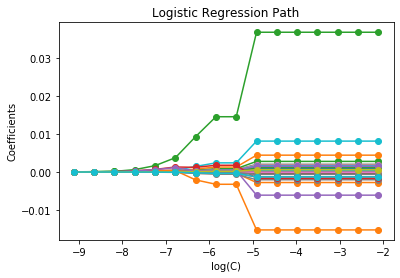

In [28]:
cs = l1_min_c(x_train, y_train, loss='log') * np.logspace(0, 7, 16)

print("Computing regularization path ...")
start = time()
coefs_ = []
for c in cs:
    log_reg.set_params(C=c)
    log_reg.fit(x_train, y_train)
    coefs_.append(log_reg.coef_.ravel().copy())
print("This took %0.3fs" % (time() - start))

coefs_ = np.array(coefs_)
plt.plot(np.log10(cs), coefs_, marker='o')
ymin, ymax = plt.ylim()
plt.xlabel('log(C)')
plt.ylabel('Coefficients')
plt.title('Logistic Regression Path')
plt.axis('tight')
plt.show()

######  To find best model, we applied Grid Search by using Logistic Regression.

In [29]:
from sklearn.model_selection import GridSearchCV

In [30]:
grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge

logreg=LogisticRegression()
logreg_cv=GridSearchCV(logreg,grid,cv=5)
logreg_cv.fit(x_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='warn',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='warn',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [31]:
log_param = logreg_cv.best_params_ #find the best parameters of logistic Regression
log_param

{'C': 1000.0, 'penalty': 'l1'}

In [32]:
log_score = logreg_cv.best_score_ #compute the accuracy of logistic regression
log_score

0.9077605666692613

In [33]:
from sklearn.model_selection import cross_val_predict


y_scores = cross_val_predict(logreg_cv, x_train, y_train, cv=3,
                             method="decision_function")

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

###### Test the Logistic Regression with best parameters

In [34]:
best_log = LogisticRegression(C = 1000.0, penalty = "l1")
best_log.fit(x_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1000.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

###### Evaluate the Logistic Regression model with best parameters.

In [35]:
from sklearn.metrics import classification_report, confusion_matrix

In [36]:
best_log_pred = best_log.predict(x_test) #make prediction with best model.

In [37]:
best_log_accuracy = best_log.score(x_test,y_test) 
best_log_accuracy
#Accuracy of the logistic regression model represents the model that we should select.

0.913760896637609

In [38]:
print(confusion_matrix(y_test, best_log_pred)) #compute the confusion matrix of the best model.

[[2520   84]
 [ 193  415]]


In [39]:
print(classification_report(y_test, best_log_pred)) # prepare the classification report for the best model.

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2604
           1       0.83      0.68      0.75       608

    accuracy                           0.91      3212
   macro avg       0.88      0.83      0.85      3212
weighted avg       0.91      0.91      0.91      3212



######  Plot Precision Recall Curve for the  Logistic Regression model with best parameters.

In [40]:
from sklearn.metrics import precision_recall_curve, roc_curve, roc_auc_score

In [98]:
def plot_precision_vs_recall(precisions, recalls): #plot the precision recall curve.
    plt.plot(recalls, precisions, "b-", linewidth=2)
    plt.xlabel("Recall", fontsize=16) 
    plt.ylabel("Precision", fontsize=16)
    plt.axis([0, 1, 0, 1])

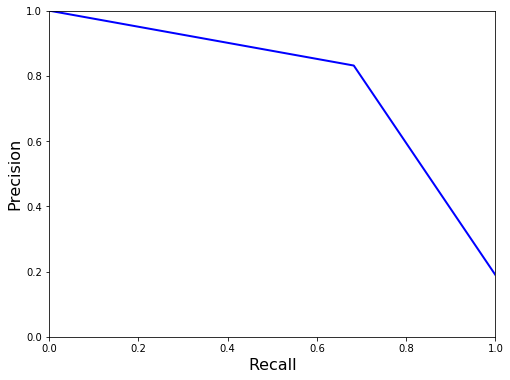

In [100]:
# precision-recall curve with the best model.
precision_log, recall_log, threshold_log = precision_recall_curve(y_test, best_log_pred) #define precision, recall and threshold

plt.figure(figsize=(8, 6))
plot_precision_vs_recall(precision_log, recall_log)
plt.show()

###### Plot ROC Curve for the Logistic Regression model with best parameters.

In [101]:
def plot_roc_curve(fpr, tpr, label=None): #plot the roc curve with false positive and true positive rates
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False Positive Rate', fontsize=16)
    plt.ylabel('True Positive Rate', fontsize=16)

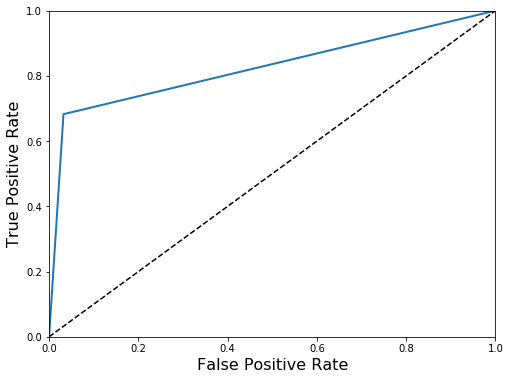

In [102]:
# ROC curve
fpr_log, tpr_log, thresholds = roc_curve(y_test, best_log_pred) #define the parameters of roc curve

plt.figure(figsize=(8, 6))
plot_roc_curve(fpr_log, tpr_log)
plt.show()

######  To find best model, we applied Grid Search by using Decision Tree model.

In [43]:
from sklearn import tree

In [44]:
decision_tree = tree.DecisionTreeClassifier(random_state = 0)
decision_tree.fit(x_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

In [45]:
#define the parameters for the grid search.
params = {'max_depth':[None, 1, 5, 10], 'min_samples_split':[0.01, 0.05, 0.1, 0.3 ], 
        'max_leaf_nodes': [10, 50, 100, 250], 'max_features' : ['auto', 'sqrt', 'log2' ]}
grid_search_best = GridSearchCV(estimator=decision_tree, param_grid = params, cv=5)
grid_search_best.fit(x_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=0,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'max_depth': [None, 1, 5, 10],
                         'max_features': ['auto', 'sqrt', 'log2'],
                

In [46]:
tree_param =  grid_search_best.best_params_ #find best parameters of Decision Tree Model
tree_param

{'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': 50,
 'min_samples_split': 0.01}

In [47]:
tree_accuracy = grid_search_best.best_score_ #accuracy of decision tree with best parameters
tree_accuracy

0.8988090604810461

###### Test the Decision Tree Model with best parameters

In [48]:
#apply parameters which is founded as best parameters to the decision tree.
tree_best = tree.DecisionTreeClassifier(max_depth= None,
 max_features= 'auto',
 max_leaf_nodes= 50,
 min_samples_split= 0.01)
tree_best.fit(x_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features='auto', max_leaf_nodes=50,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=0.01,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

###### Evaluate the best model

In [49]:
best_pred = tree_best.predict(x_test) #make prediction with the best model.

In [50]:
score_best = tree_best.score(x_test,y_test) #calculate the accuracy of the best model.
score_best 

0.8935242839352429

In [51]:
print(confusion_matrix(y_test, best_pred)) #compute the confusion matrix of the best model.

[[2459  145]
 [ 197  411]]


In [52]:
print(classification_report(y_test, best_pred)) # prepare the classification report for the best model.

              precision    recall  f1-score   support

           0       0.93      0.94      0.93      2604
           1       0.74      0.68      0.71       608

    accuracy                           0.89      3212
   macro avg       0.83      0.81      0.82      3212
weighted avg       0.89      0.89      0.89      3212



######  Visualize the Decison Tree

In [154]:
!{sys.executable} -m pip install dtreeplt

In [71]:
from dtreeplt import dtreeplt

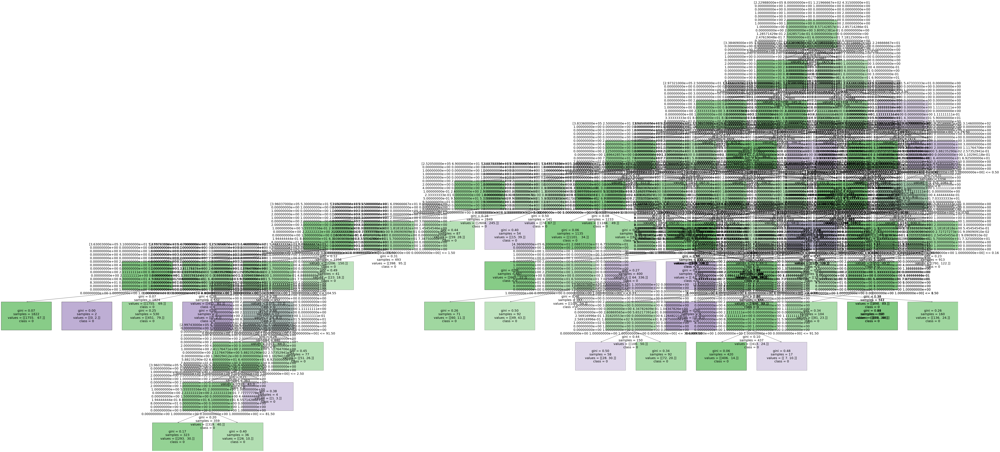

In [189]:
dtree = dtreeplt(
    model=tree_best,
    feature_names=np.array(x_train),
    target_names=np.array(y_train)
)
fig = dtree.view()
#if you want save figure, use savefig method in returned figure object.
#fig.savefig('output.png')

######  Random Forest Classifier.

In [57]:
from sklearn.ensemble import RandomForestClassifier

In [58]:
#Define parameters for Random Forest Regressor.
paramf = {'n_estimators':[25, 50, 100, 250 ], 'max_depth':[None, 1, 5, 10 ]}

In [60]:
#Create RandomForestClassifier model and use it in GridSearchCv to find best combination.
random_forest_grid = GridSearchCV(RandomForestClassifier(random_state=0), paramf, verbose=1, cv = 5, scoring='neg_mean_squared_error')
random_forest_grid.fit(x_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  2.3min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=0,
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'m

In [61]:
#Find best parameters of Random Forest Classifier.
random_forest_grid.best_params_

{'max_depth': None, 'n_estimators': 100}

###### Test Random Forest Classifier with best parameters.

In [67]:
from sklearn.metrics import mean_squared_error

In [64]:
best_random_forest = RandomForestClassifier(n_estimators=100, max_depth = None)
best_random_forest.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [65]:
#Make prediction with test set.
random_forest_preds = best_random_forest.predict(x_test)

In [95]:
#Print Confusion matrix
print(confusion_matrix(y_test,random_forest_preds ))

[[2543   61]
 [ 188  420]]


In [94]:
#Accuracy of random forest
print(best_random_forest.score(x_test,y_test))

0.9224782067247821


In [69]:
print(classification_report(y_test, random_forest_preds)) #classification report for random forest.

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      2604
           1       0.87      0.69      0.77       608

    accuracy                           0.92      3212
   macro avg       0.90      0.83      0.86      3212
weighted avg       0.92      0.92      0.92      3212



######  Plot Precision Recall Curve for Random Forest model

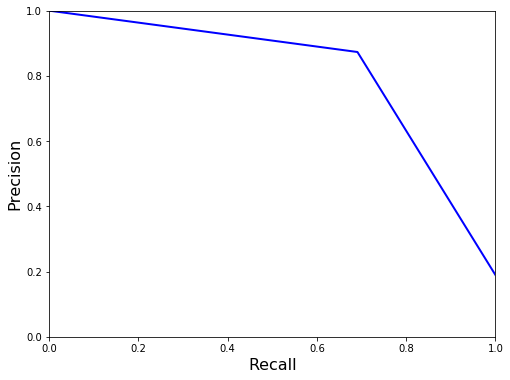

In [97]:
precision_rd, recalls_rd, thresholds_rd = precision_recall_curve(y_test, random_forest_preds) #define precision, recall and threshold
plt.figure(figsize=(8, 6))
plot_precision_vs_recall(precision_rd, recalls_rd)
plt.show()

###### Plot ROC Corve for Random Forest Model

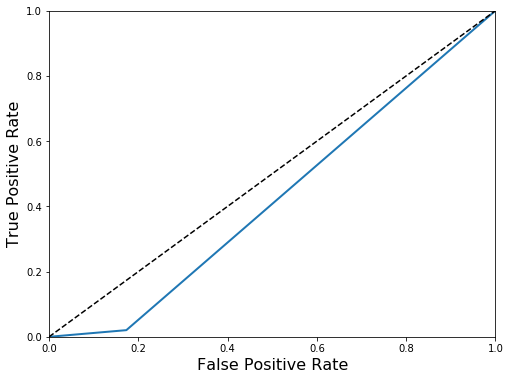

In [119]:
# ROC curve
fpr_rnd, tpr_rnd, thresholds = roc_curve(y_test_r, random_forest_preds) #define the parameters of roc curve

plt.figure(figsize=(8, 6))
plot_roc_curve(fpr_rnd, tpr_rnd)
plt.show()

# Split data into train and test set using "Readmitted" column as a target.

In [104]:
x_train_r, x_test_r, y_train_r, y_test_r = train_test_split(train_x_r, y_r, test_size=0.20, random_state=0)

######  Apply Logistic Regression with best parameters founded by Grid Search

In [105]:
logistic_reg = LogisticRegression(random_state = 0)
logistic_reg.fit(x_train_r, y_train_r)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [106]:
grid_param ={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge 

grid_log = GridSearchCV(logistic_reg, grid_param, cv = 5)
grid_log.fit(x_train_r, y_train_r)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence t

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='warn',
                                          n_jobs=None, penalty='l2',
                                          random_state=0, solver='warn',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [107]:
best_param_r = grid_log.best_params_
best_param_r

{'C': 1.0, 'penalty': 'l1'}

In [108]:
best_accuracy_r = grid_log.best_score_
best_accuracy_r

0.8524947458550635

######  Test Logistic Regression model with best parameters on Readmission target value.

In [109]:
best_log_r = LogisticRegression(C = 1.0, penalty = "l1")

In [110]:
best_log_r.fit(x_train_r, y_train_r )

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [111]:
test_accuracy_log = best_log_r.score(x_test_r, y_test_r)
test_accuracy_log

0.8533623910336239

In [112]:
prediction_best_log_r = best_log_r.predict(x_test_r)

In [113]:
confusion_matrix_r = confusion_matrix(y_test_r, prediction_best_log_r)
confusion_matrix_r

array([[2704,   17],
       [ 454,   37]], dtype=int64)

In [114]:
print(classification_report(y_test_r, prediction_best_log_r))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92      2721
           1       0.69      0.08      0.14       491

    accuracy                           0.85      3212
   macro avg       0.77      0.53      0.53      3212
weighted avg       0.83      0.85      0.80      3212



######  Plot Precision Recall Curve with the best Logistic Regression model using Readmission datas as target.

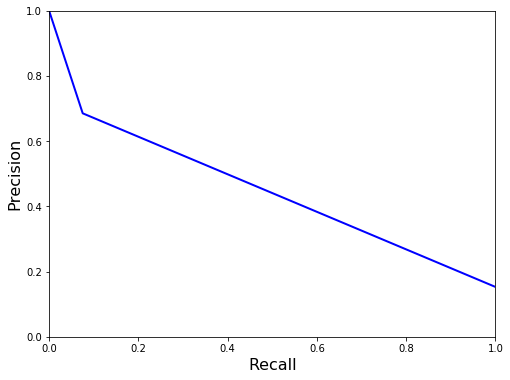

In [116]:
# precision-recall curve
precision_log_r, recall_log_r, threshold_log_r = precision_recall_curve(y_test_r, prediction_best_log_r) #define precision, recall and threshold

plt.figure(figsize=(8, 6))
plot_precision_vs_recall(precision_log_r, recall_log_r)
plt.show()

######  Plot ROC Curve of the best Logistic Regression model.

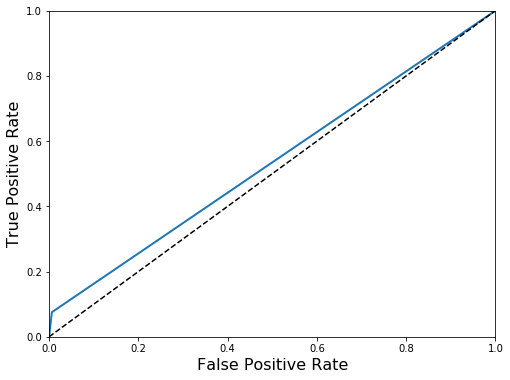

In [117]:
# ROC curve
fpr_log_r, tpr_log_r, thresholds = roc_curve(y_test_r, prediction_best_log_r) #define the parameters of roc curve

plt.figure(figsize=(8, 6))
plot_roc_curve(fpr_log_r, tpr_log_r)
plt.show()

######  Apply Decision Tree Model with best parameters founded by Grid Search.

In [44]:
decision_tree_r = tree.DecisionTreeClassifier(random_state = 0)
decision_tree_r.fit(x_train_r, y_train_r)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

In [46]:
#define the parameters for the grid search.
params = {'max_depth':[None, 1, 5, 10], 'min_samples_split':[0.01, 0.05, 0.1, 0.3 ], 
        'max_leaf_nodes': [10, 50, 100, 250], 'max_features' : ['auto', 'sqrt', 'log2' ]}
grid_search_tree_r = GridSearchCV(estimator=decision_tree_r, param_grid = params, cv=5)
grid_search_tree_r.fit(x_train_r, y_train_r)

GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=0,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'max_depth': [None, 1, 5, 10],
                         'max_features': ['auto', 'sqrt', 'log2'],
                

In [47]:
best_param_tree_r = grid_search_tree_r.best_params_
best_param_tree_r

{'max_depth': 5,
 'max_features': 'auto',
 'max_leaf_nodes': 50,
 'min_samples_split': 0.01}

In [49]:
accuracy_tree_r = grid_search_tree_r.best_score_
accuracy_tree_r

0.8551412781194053

###### Evaluate Decision Tree Model with Test Data

In [51]:
dc_tree_best = tree.DecisionTreeClassifier(max_depth=5, max_features="auto", max_leaf_nodes=50, min_samples_split=0.01)
dc_tree_best.fit(x_train_r, y_train_r)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features='auto', max_leaf_nodes=50,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=0.01,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [52]:
test_tree_accuracy = dc_tree_best.score(x_test_r,y_test_r)
test_tree_accuracy

0.8465130759651308

In [55]:
tree_pred_r = dc_tree_best.predict(x_test_r)

In [56]:
conf_matrix_tree = confusion_matrix(y_test_r, tree_pred_r)
conf_matrix_tree

array([[2718,    3],
       [ 490,    1]], dtype=int64)

In [57]:
print(classification_report(y_test_r, tree_pred_r))

              precision    recall  f1-score   support

           0       0.85      1.00      0.92      2721
           1       0.25      0.00      0.00       491

    accuracy                           0.85      3212
   macro avg       0.55      0.50      0.46      3212
weighted avg       0.76      0.85      0.78      3212



######  Visualize Decision Tree

C:\ProgramData\Anaconda3\lib\site-packages\dtreeplt\dtreeplt.py:185: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if not tree_info_dict['features'][i] == 'target':


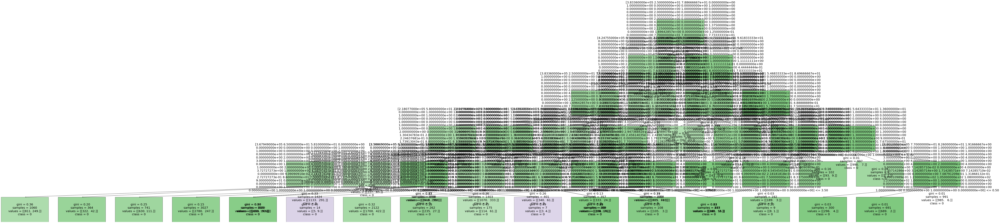

In [190]:
dtree_r = dtreeplt(
    model=dc_tree_best,
    feature_names=np.array(x_train_r),
    target_names=np.array(y_train_r)
)
fig = dtree_r.view()
#if you want save figure, use savefig method in returned figure object.
#fig.savefig('output_r.png')

######  Define Random Forest Classifier Model for readmitted target value.

In [121]:
#Define parameters for Random Forest Regressor.
paramf_r = {'n_estimators':[25, 50, 100, 250 ], 'max_depth':[None, 1, 5, 10 ]}
#Create RandomForestClassifier model and use it in GridSearchCv to find best combination.
random_forest_grid_r = GridSearchCV(RandomForestClassifier(random_state=0), paramf, verbose=1, cv = 5, scoring='neg_mean_squared_error')
random_forest_grid_r.fit(x_train_r, y_train_r)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  2.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=0,
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'m

In [122]:
#Find best parameters of Random Forest Classifier.
random_forest_grid_r.best_params_

{'max_depth': None, 'n_estimators': 100}

######  Evaluate Random Forest model with best parameters on test set.

In [123]:
best_random_forest_r = RandomForestClassifier(n_estimators=100, max_depth = None)
best_random_forest_r.fit(x_train_r, y_train_r)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [126]:
best_random_pred_r = best_random_forest_r.predict(x_test_r)

In [127]:
#Accuracy of random forest
print(best_random_forest_r.score(x_test_r,y_test_r))

0.8580323785803238


In [128]:
#Print Confusion matrix
print(confusion_matrix(y_test_r,best_random_pred_r ))

[[2702   19]
 [ 437   54]]


In [130]:
print(classification_report(y_test_r, best_random_pred_r)) #classification report for random forest.

              precision    recall  f1-score   support

           0       0.86      0.99      0.92      2721
           1       0.74      0.11      0.19       491

    accuracy                           0.86      3212
   macro avg       0.80      0.55      0.56      3212
weighted avg       0.84      0.86      0.81      3212



######  Plot Precision Recall curve 

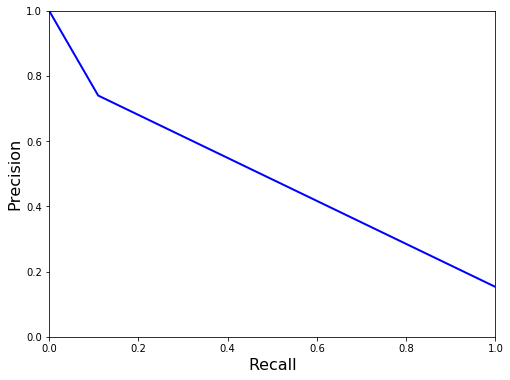

In [131]:
precision_rd_r, recalls_rd_r, thresholds_rd_r = precision_recall_curve(y_test_r, best_random_pred_r) #define precision, recall and threshold
plt.figure(figsize=(8, 6))
plot_precision_vs_recall(precision_rd_r, recalls_rd_r)
plt.show()

######  Plot ROC Curve

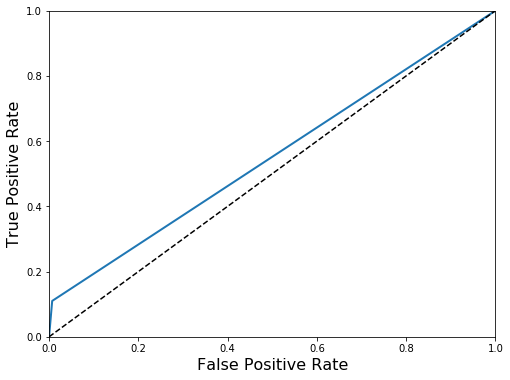

In [132]:
# ROC curve
fpr_rnd_r, tpr_rnd_r, threshold_r = roc_curve(y_test_r, best_random_pred_r) #define the parameters of roc curve

plt.figure(figsize=(8, 6))
plot_roc_curve(fpr_rnd_r, tpr_rnd_r)
plt.show()